# Green Infrastructure in Métropole du Grand Paris

This notebook presents the data analysis I carried out for the Applied Data Science Capstone course as part of the IBM Applied Data Science Specialization. I benefited from course lab sessions to prepare this notebook.

## 1. Get necessary libraries and modules: 

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

# import k-means from clustering stage
from sklearn.cluster import KMeans

import folium # map rendering library

# import k-means Elbow method visualizer from clustering stage
from yellowbrick.cluster import KElbowVisualizer

# import stats to test for correlation
from scipy import stats 


C:\Users\cilem\Miniconda3\lib\site-packages\sklearn\utils\deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


## 1. Prepare a dataframe including neighborhoods in the Métropole du Grand Paris

Métropole du Grand Paris consists of the city of Paris and some communes located in the inner and outer suburbs of the city. The city of Paris contains 20 arrondissements, which I will treat as individual neighborhoods. Communes located in inner suburbs refers to all 123 communes of Hauts-de-Seine, Seine-Saint-Denis, and Val-de-Marne. Whereas communes located in outer suburbs refer to 7 communes located in l'Essonne and le Val-d'Oise. The arrondissements in the city and the communes make in total 150 neighborhoods.
In this section I consolidate data on arrondissements and communes, and organize them as a dataframe.

### Convert data on arrondissements in Paris city into a dataframe

In [2]:
# read the data on arrondissements in Paris city
city=pd.read_csv('arrondissements.csv', sep=';',encoding='latin-1', error_bad_lines=False)
city.head()

,Chiffres détaillés - Comparateur de territoires,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44,Unnamed: 45,Unnamed: 46,Unnamed: 47,Unnamed: 48,Unnamed: 49,Unnamed: 50,Unnamed: 51,Unnamed: 52,Unnamed: 53,Unnamed: 54,Unnamed: 55,Unnamed: 56,Unnamed: 57,Unnamed: 58,Unnamed: 59,Unnamed: 60,Unnamed: 61,Unnamed: 62,Unnamed: 63,Unnamed: 64,Unnamed: 65,Unnamed: 66,Unnamed: 67,Unnamed: 68,Unnamed: 69,Unnamed: 70,Unnamed: 71,Unnamed: 72,Unnamed: 73,Unnamed: 74,Unnamed: 75,Unnamed: 76,Unnamed: 77,Unnamed: 78,Unnamed: 79,Unnamed: 80,Unnamed: 81,Unnamed: 82,Unnamed: 83,Unnamed: 84,Unnamed: 85,Unnamed: 86,Unnamed: 87,Unnamed: 88,Unnamed: 89,Unnamed: 90,Unnamed: 91,Unnamed: 92,Unnamed: 93,Unnamed: 94,Unnamed: 95,Unnamed: 96,Unnamed: 97,Unnamed: 98,Unnamed: 99
0,Arrondissements municipaux,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Mise en ligne le 16/06/2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"©Insee Source(s) : Insee, Recensements d...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,CODGEO,Libellé commune ou ARM,Région,Département,Population en 2016,Population en 2011,Superficie,Naissances entre 2011 et 2016,Décès entre 2011 et 2016,Ménages en 2016,Nombre de naissances domiciliées en 2018,Nombre de décès domiciliés en 2018,Logements en 2016,Résidences principales en 2016,Rés secondaires et logts occasionnels en 2016,Logements vacants en 2016,Rés princ occupées Propriétaires en 2016,Nombre de ménages fiscaux en 2017,Part des ménages fiscaux imposés en 2017 (%),Médiane du niveau de vie en 2017 (),Taux de pauvreté en 2017 (%),Emplois au LT en 2016,Emplois salariés au LT en 2016,Emplois au LT en 2011,Pop 15-64 ans en 2016,Chômeurs 15-64 ans en 2016,Actifs 15-64 ans en 2016,Total des ets actifs au 31 décembre 2015,Ets actifs agriculture au 31/12/2015,Ets actifs industrie au 31/12/2015,Ets actifs construction au 31/12/2015,Ets actifs commerce services au 31/12/2015,dont Ets actifs commerce rep auto au 31/12/2015,Ets actifs adm publique au 31/12/2015,Ets actifs de 1 à 9 salariés au 31 décembre 2015,Ets actifs 10 salariés ou plus au 31 décembre ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,CODGEO,LIBGEO,REG,DEP,P16_POP,P11_POP,SUPERF,NAIS1116,DECE1116,P16_MEN,NAISD18,DECESD18,P16_LOG,P16_RP,P16_RSECOCC,P16_LOGVAC,P16_RP_PROP

In [3]:
# data of interest starts at the 4th row, so omit the beginning and set column headers 
city.columns = city.iloc[4]
city=pd.DataFrame(city[5:])
city.head()

4,CODGEO,LIBGEO,REG,DEP,P16_POP,P11_POP,SUPERF,NAIS1116,DECE1116,P16_MEN,NAISD18,DECESD18,P16_LOG,P16_RP,P16_RSECOCC,P16_LOGVAC,P16_RP_PROP,NBMENFISC17,PIMP17,MED17,TP6017,P16_EMPLT,P16_EMPLT_SAL,P11_EMPLT,P16_POP1564,P16_CHOM1564,P16_ACT1564,ETTOT15,ETAZ15,ETBE15,ETFZ15,ETGU15,ETGZ15,ETOQ15,ETTEF115,ETTEFP1015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,13201,Marseille 1er Arrondissement,93,13,40202,38356,2,3235,1297,20907,810,248,24032,20907,1377,1748,5698,16307,36,14440,41,21079,17851,20271,27639,4654,17283,9103,3,379,520,7359,2133,842,2533,357,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,13202,Marseille 2e Arrondissement,93,13,24888,24634,5,2280,855,11968,435,240,15583,11968,985,2630,2739,10906,37,14530,40,20714,19015,17285,16375,2643,10416,4059,2,143,286,3214,839,414,1089,359,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,13203,Marseille 3e Arrondissement,93,13,47773,44600,3,5360,1493,20126,1167,308,23878,20126,513,3239,4474,19089,22,12170,53,16759,15089,14050,30755,5185,17042,3238,3,120,406,2227,751,482,776,171,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,13204,Marseille 4e Arrondissement,93,13,48074,47953,3,3595,2389,24802,740,483,27937,24802,578,2558,10870,23415,48,18660,22,13664,11645,16819,29884,3946,21804,4323,2,173,485,2811,743,852,862,121,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,13205,Marseille 5e Arrondissement,93,13,46274,46180,2,3184,1831,26113,638,323,29706,26113,1339,2254,9247,21315,47,18860,24,21264,18986,21156,32033,3619,22281,4350,3,208,442,2792,582,905,741,126,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
#check data types of key variables of interest
city[['CODGEO','DEP','P16_POP','SUPERF']].dtypes

4
CODGEO     object
DEP        object
P16_POP    object
SUPERF     object
dtype: object

In [5]:
# get only arrondisements of Paris
city=city[city['DEP']=='75']
# select necessary columns, rename and convert them to integers
city=city[['CODGEO','LIBGEO','P16_POP','SUPERF']]
city.columns=['Code','Neighborhood', 'Population','Surface']
city[['Code', 'Population']]=city[['Code', 'Population']].astype(np.int64)
city[['Surface']]=city[['Surface']].astype(float)

# check data size
print("Paris city has 20 arrondissements and the data has {} rows.".format(city.shape[0]))

Paris city has 20 arrondissements and the data has 20 rows.


### Convert data on communes into a dataframe

In [6]:
# read the data on communes
communes=pd.read_csv('epcicom2016.csv', sep=';',encoding='latin-1')
communes=pd.DataFrame(communes)
communes.head()

C:\Users\cilem\Miniconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (1,2,8) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,reg,dep_com,insee,nom_com,ptot,pmun,superficie,zm,dep_epci,siren_epci,nom_epci,nj_epci,fisc_epci,nb_com_epci,ptot_epci,pmun_epci
0,84,01,01001,L'Abergement-Clémenciat,780,767,"15,95",0,01,200035210.0,CC Chalaronne Centre,CC,FA,15.0,14858.0,14495.0
1,84,01,01002,L'Abergement-de-Varey,240,236,"9,15",1,01,240100883.0,CC de la Plaine de l'Ain,CC,FPU,33.0,67433.0,65771.0
2,84,01,01004,Ambérieu-en-Bugey,14888,14359,"24,6",0,01,240100883.0,CC de la Plaine de l'Ain,CC,FPU,33.0,67433.0,65771.0
3,84,01,01005,Ambérieux-en-Dombes,1666,1635,"15,92",0,01,200042497.0,CC Dombes Saône Vallée,CC,FPU,19.0,37111.0,35967.0
4,84,01,01006,Ambléon,114,108,"5,88",1,01,200040350.0,CC Bugey Sud,CC,FPU,39.0,29970.0,29055.0


In [7]:
#check data types of key variables of interest
communes[['reg','dep_com','insee','nom_com','ptot', 'superficie', 'siren_epci']].dtypes

reg             int64
dep_com        object
insee          object
nom_com        object
ptot            int64
superficie     object
siren_epci    float64
dtype: object

In [8]:
# select communes in Métropole du Grand Paris
communes=communes[communes['siren_epci']==200054781]
communes=communes[communes['insee']!='75056']
# select necessary columns, rename and convert them to integers
communes=communes[['insee','nom_com','ptot', 'superficie']]
communes.columns=['Code','Neighborhood', 'Population','Surface']
communes[['Code','Population']]=communes[['Code','Population']].astype(np.int64)
communes['Surface']=(communes['Surface'].str.replace(',','.').astype(float))
# check data size
print("Métropole du Grand Paris contains 130 communes and the data has {} rows".format(communes.shape[0]))

Métropole du Grand Paris contains 130 communes and the data has 130 rows


### Convert coordinates data into a dataframe

In [9]:
#read the coordinates as a new dataframe
coordinates=pd.read_csv('liste_villes_francaise_2015.csv', sep=',')
coordinates=pd.DataFrame(coordinates)
coordinates.columns=['Code', 'ZIP', 'Name', 'Neighborhood', 'Latitude', 'Longitude', 'Code_Com', 'Code_Canton','Code_Arr', 'Code_Dep']

#check the table
coordinates.head()

,Code,ZIP,Name,Neighborhood,Latitude,Longitude,Code_Com,Code_Canton,Code_Arr,Code_Dep
0,72022,72200,Bailleul,Le,47.772431,-0.179562,22,17,1,72
1,86141,86160,Magné,NaN,46.349600,0.391445,141,8,2,86
2,88509,88150,Villoncourt,NaN,48.269627,6.516346,509,6,1,88
3,55482,55220,Senoncourt-les-Maujouy,NaN,49.058541,5.343942,482,18,3,55
4,19139,19290,Millevaches,NaN,45.645674,2.089264,139,23,3,19


In [10]:
#check data type of 'Code' as it will be the merge key
coordinates[['Code']].dtypes

Code    object
dtype: object

In [11]:
# convert 'Code' to integer as it will be the merge key
# to avoid irregular codes that cannot be forced into integer, reduce the data to the department containing Métropole du Grand Paris 
dept_list=['75','91','92','93','94','95']
coordinates=coordinates[coordinates['Code_Dep'].isin(dept_list)]
coordinates['Code']=coordinates['Code'].astype(np.int64)

# keep only necessary columns in coordinates table
coordinates=coordinates[['Code','Latitude','Longitude']]

# check the result
coordinates.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 524 entries, 243 to 36706
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Code       524 non-null    int64  
 1   Latitude   524 non-null    float64
 2   Longitude  524 non-null    float64
dtypes: float64(2), int64(1)
memory usage: 16.4 KB


### Bring together data on arrondissements, communes, and coordinates

In [12]:
# join neighborhoods
neighborhoods=city.append(communes)
# use coordinates table to geolocalize neighborhoods
df=pd.merge(neighborhoods,coordinates, on='Code', how='left', indicator=False)
# calculate population density
df['Density']=df['Population']/df['Surface']
#check data size
print("Métropole du Grand Paris contains 150 neighborhoods and the data has {} rows".format(communes.shape[0]))

Métropole du Grand Paris contains 150 neighborhoods and the data has 130 rows


In [13]:
df.head()

,Code,Neighborhood,Population,Surface,Latitude,Longitude,Density
0,75101,Paris 1er Arrondissement,16252,2.0,48.862630,2.336293,8126.000000
1,75102,Paris 2e Arrondissement,20260,1.0,48.867903,2.344107,20260.000000
2,75103,Paris 3e Arrondissement,34788,1.0,48.863054,2.359361,34788.000000
3,75104,Paris 4e Arrondissement,27487,2.0,48.854228,2.357362,13743.500000
4,75105,Paris 5e Arrondissement,59108,3.0,48.844509,2.349859,19702.666667


### Visualize Neighborhoods on a Map

In [14]:
# get coordinates of Paris
address = 'Paris, France'

geolocator = Nominatim(user_agent="paris_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Paris are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Paris are 48.8566969, 2.3514616.


In [15]:
# read neighborhoods json file 
paris_geodata = r'Communes_MGP.json'

# create a coropleth map of neighborhoods showing population density
map_paris = folium.Map(location=[latitude, longitude], zoom_start=10, tiles='OpenStreetMap')

map_paris.choropleth(
    geo_data=paris_geodata,
    data=df,
    columns=['Code', 'Density'],
    key_on='feature.properties.C_INSEE',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Population Density'
)


map_paris

C:\Users\cilem\Miniconda3\lib\site-packages\folium\folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


## 2. Obtain data on venues under "Outdoors & Recreation" category in Foursquare

In [ ]:
## Define Foursquare Credentials and Version
CLIENT_ID = '' # your Foursquare ID
CLIENT_SECRET = '' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

In [16]:
def getNearbyVenues(names, latitudes, longitudes, radius=500, limit=100, outdoor="4d4b7105d754a06377d81259"):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            limit,
        outdoor)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [ ]:
# create a dataframe for venues
paris_venues = getNearbyVenues(names=df['Neighborhood'],
                                   latitudes=df['Latitude'],
                                   longitudes=df['Longitude']
                                  )

In [17]:
paris_venues=pd.read_csv('paris_f2data.txt', sep='\t')

In [18]:
paris_venues.shape

(672, 7)

In [19]:
paris_venues['Venue Category'].unique()

array(['Plaza', 'Garden', 'Sculpture Garden', 'Pedestrian Plaza',
       'Fountain', 'Gym / Fitness Center', 'Sports Club',
       'Athletics & Sports', 'Gym', 'Park', 'Yoga Studio', 'Skate Park',
       'Gym Pool', 'Pilates Studio', 'Outdoors & Recreation', 'Trail',
       'Waterfront', 'Basketball Court', 'Harbor / Marina', 'Pool',
       'Playground', 'Tennis Court', 'Baseball Field', 'Cycle Studio',
       'Boxing Gym', 'Canal Lock', 'River', 'Soccer Field',
       'Martial Arts Dojo', 'Lake', 'Roof Deck', 'Canal', 'Bathing Area',
       'Beach', 'Forest', 'Skating Rink', 'Golf Course', 'Castle',
       'Scenic Lookout', 'Farm', 'Campground', 'Botanical Garden',
       'Recreation Center', 'Dog Run', 'Gymnastics Gym', 'Track',
       'Indoor Play Area', 'Tree', 'Squash Court'], dtype=object)

In [20]:
paris_venues = paris_venues.drop(paris_venues[paris_venues['Venue Category']=='Outdoors & Recreation'].index)

In [21]:
paris_venues.shape

(671, 7)

In [22]:
paris_venues['Num_venues']=paris_venues.groupby('Neighborhood')['Neighborhood'].transform('count')
paris_grouped_venues=paris_venues[['Neighborhood','Num_venues']].drop_duplicates()
paris_grouped_venues.shape

(131, 2)

In [23]:
df=pd.merge(df,paris_grouped_venues, on='Neighborhood', how='left', indicator=True)
df.loc[df['_merge']== 'left_only','Num_venues'] = 0

## 3. Examine Spatial Distribution of GI Venues

In [24]:
# create a coropleth map of neighborhoods showing population density
map_gi_paris = folium.Map(location=[latitude, longitude], zoom_start=10, tiles='OpenStreetMap')

map_gi_paris.choropleth(
    geo_data=paris_geodata,
    data=df,
    columns=['Code', 'Num_venues'],
    key_on='feature.properties.C_INSEE',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Number of Green Infrastructure Venues'
)


map_gi_paris

In [25]:
df[["Density","Num_venues"]].describe(percentiles=[0.25, 0.50, 0.75, 0.90, 0.95, 0.99])

,Density,Num_venues
count,150.000000,150.000000
mean,10124.019498,4.473333
std,8047.270355,5.607637
min,374.873865,0.000000
25%,4821.946855,1.000000
50%,7807.043485,3.000000
75%,13050.023747,5.000000
90%,22984.397343,10.100000
95%,27684.626037,14.550000
99%,33716.206667,25.060000


In [26]:
pearson_coef, p_value = stats.pearsonr(df["Density"], df["Num_venues"]) #define the columns to perform calculations on
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value)

Pearson Correlation Coefficient:  0.5936681059940457 and a P-value of: 1.1803059330745964e-15


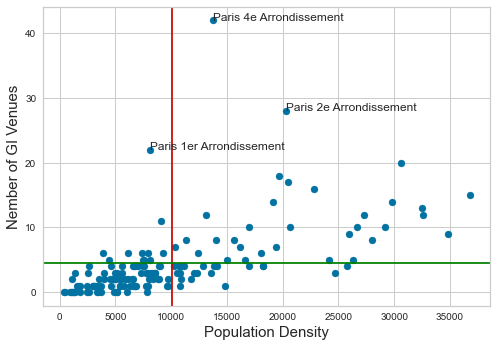

In [27]:

#plt.plot( 'Density', 'Num_venues', data=df, linestyle='none', marker='o')
fig, ax = plt.subplots()
ax.scatter(df["Density"], df["Num_venues"]) 
# Annotation
plt.axvline(df["Density"].mean(), color='r')
plt.axhline(df["Num_venues"].mean(), color='green')
ax.set_xlabel('Population Density', fontsize=15)
ax.set_ylabel('Nember of GI Venues', fontsize=15) 
for i, txt in enumerate(df["Neighborhood"]):
    if df["Num_venues"][i]>20:
        ax.annotate(txt, (df["Density"][i], df["Num_venues"][i]))

## 4. Cluster Neighborhoods

In [28]:
venues_restricted=paris_venues[paris_venues['Num_venues']>=7]
venues_restricted.shape

(377, 8)

In [29]:
paris_venues.shape

(671, 8)

In [30]:
# one hot encoding
paris_onehot = pd.get_dummies(venues_restricted[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
paris_onehot['Neighborhood'] = venues_restricted['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [paris_onehot.columns[-1]] + list(paris_onehot.columns[:-1])
paris_onehot = paris_onehot[fixed_columns]

paris_onehot.head()

,Neighborhood,Athletics & Sports,Baseball Field,Basketball Court,Bathing Area,Boxing Gym,Canal,Canal Lock,Cycle Studio,Farm,Fountain,Garden,Golf Course,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Lake,Martial Arts Dojo,Park,Pedestrian Plaza,Pilates Studio,Playground,Plaza,Pool,River,Roof Deck,Sculpture Garden,Skate Park,Skating Rink,Soccer Field,Sports Club,Tennis Court,Trail,Waterfront,Yoga Studio
0,Paris 1er Arrondissement,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,Paris 1er Arrondissement,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
2,Paris 1er Arrondissement,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,Paris 1er Arrondissement,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Paris 1er Arrondissement,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [31]:
print('There are {} uniques categories.'.format(len(paris_venues['Venue Category'].unique())))

There are 48 uniques categories.


In [32]:
paris_grouped = paris_onehot.groupby('Neighborhood').mean().reset_index()

In [33]:
def return_most_common_venues(row, num_top_venues):

    row_categories = row.iloc[1:]

    row_categories_sorted = row_categories.sort_values(ascending=False)

    

    return row_categories_sorted.index.values[0:num_top_venues]



In [34]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = paris_grouped['Neighborhood']

for ind in np.arange(paris_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(paris_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Boulogne-Billancourt,Plaza,Gym,Martial Arts Dojo,Garden,Park
1,Clichy,Park,Plaza,Athletics & Sports,Sports Club,Gym
2,Courbevoie,Park,Gym,Plaza,Tennis Court,Garden
3,Gentilly,Plaza,Martial Arts Dojo,Garden,Gym,Gym / Fitness Center
4,Issy-les-Moulineaux,Gym / Fitness Center,Soccer Field,Park,Plaza,Pool


In [35]:
neighborhoods_venues_sorted.shape


(28, 6)

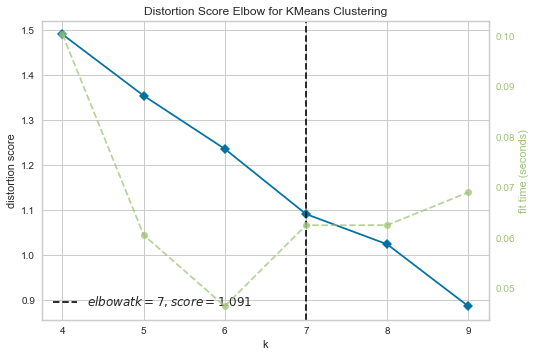

In [36]:
paris_grouped_clustering = paris_grouped.drop('Neighborhood', 1)

model = KMeans(random_state=42)
visualizer = KElbowVisualizer(model, k=(4,10))

visualizer.fit(paris_grouped_clustering)        # Fit the data to the visualizer
visualizer.show() 

In [37]:
kclusters = 7

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(paris_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([5, 4, 5, 5, 0, 2, 3, 4, 4, 3])

In [38]:
kmeans.labels_.shape

(28,)

In [39]:
# add clustering labels 
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

#paris_merged = df

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
#paris_merged = paris_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')
neighborhoods_venues_sorted=neighborhoods_venues_sorted.set_index('Neighborhood')
df2=df.set_index('Neighborhood')
paris_merged=pd.merge(neighborhoods_venues_sorted,df2, on='Neighborhood', how='left', indicator=False)
paris_merged.head() # check the last columns!

,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Code,Population,Surface,Latitude,Longitude,Density,Num_venues,_merge
Neighborhood,,,,,,,,,,,,,,
Boulogne-Billancourt,5,Plaza,Gym,Martial Arts Dojo,Garden,Park,92012,117947,6.17,48.836584,2.239136,19116.207455,14.0,both
Clichy,4,Park,Plaza,Athletics & Sports,Sports Club,Gym,92024,59639,3.08,48.903536,2.305752,19363.311688,7.0,both
Courbevoie,5,Park,Gym,Plaza,Tennis Court,Garden,92026,86228,4.17,48.898450,2.255706,20678.177458,10.0,both
Gentilly,5,Plaza,Martial Arts Dojo,Garden,Gym,Gym / Fitness Center,94037,16569,1.18,48.813204,2.344207,14041.525424,8.0,both
Issy-les-Moulineaux,0,Gym / Fitness Center,Soccer Field,Park,Plaza,Pool,92040,66557,4.25,48.823474,2.264498,15660.470588,8.0,both


In [40]:
paris_merged=paris_merged.reset_index()

In [41]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(paris_merged['Latitude'], paris_merged['Longitude'], paris_merged['Neighborhood'], paris_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [42]:
paris_merged.loc[paris_merged['Cluster Labels'] == 0, paris_merged.columns[[1] + list(range(2, paris_merged.shape[1]))]]


,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Code,Population,Surface,Latitude,Longitude,Density,Num_venues,_merge
4,0,Gym / Fitness Center,Soccer Field,Park,Plaza,Pool,92040,66557,4.25,48.823474,2.264498,15660.470588,8.0,both


In [43]:
paris_merged.loc[paris_merged['Cluster Labels'] == 1, paris_merged.columns[[1] + list(range(2, paris_merged.shape[1]))]]

,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Code,Population,Surface,Latitude,Longitude,Density,Num_venues,_merge
17,1,Martial Arts Dojo,Gym / Fitness Center,Playground,Harbor / Marina,Canal,75119,186393,7.0,48.886869,2.384694,26627.571429,10.0,both
20,1,Gym / Fitness Center,Plaza,Pedestrian Plaza,Gym,Yoga Studio,75102,20260,1.0,48.867903,2.344107,20260.000000,28.0,both


In [44]:
paris_merged.loc[paris_merged['Cluster Labels'] == 2, paris_merged.columns[[1] + list(range(2, paris_merged.shape[1]))]]


,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Code,Population,Surface,Latitude,Longitude,Density,Num_venues,_merge
5,2,Plaza,Park,Playground,Yoga Studio,Fountain,92035,28847,1.78,48.906758,2.244646,16206.179775,7.0,both
15,2,Plaza,Gym / Fitness Center,Gym,Pool,Yoga Studio,75117,167835,6.00,48.887337,2.307486,27972.500000,8.0,both
18,2,Plaza,Gym / Fitness Center,Pedestrian Plaza,Garden,Sculpture Garden,75101,16252,2.00,48.862630,2.336293,8126.000000,22.0,both
23,2,Plaza,Athletics & Sports,Fountain,Park,Garden,75105,59108,3.00,48.844509,2.349859,19702.666667,18.0,both
25,2,Plaza,Park,Garden,Baseball Field,Sculpture Garden,75107,52512,4.00,48.856083,2.312439,13128.000000,12.0,both
26,2,Plaza,Garden,Athletics & Sports,Park,Gym / Fitness Center,75108,36453,4.00,48.872527,2.312583,9113.250000,11.0,both


In [45]:
paris_merged.loc[paris_merged['Cluster Labels'] == 3, paris_merged.columns[[1] + list(range(2, paris_merged.shape[1]))]]

,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Code,Population,Surface,Latitude,Longitude,Density,Num_venues,_merge
6,3,Park,Plaza,Gym / Fitness Center,Golf Course,Garden,92044,65872,2.41,48.895072,2.286883,27332.780083,12.0,both
9,3,Plaza,Canal Lock,Park,Garden,Yoga Studio,75110,91932,3.00,48.876029,2.361113,30644.000000,20.0,both
21,3,Yoga Studio,Park,Garden,Pilates Studio,Plaza,75103,34788,1.00,48.863054,2.359361,34788.000000,9.0,both
22,3,Garden,Park,Plaza,Pedestrian Plaza,Harbor / Marina,75104,27487,2.00,48.854228,2.357362,13743.500000,42.0,both


In [46]:
paris_merged.loc[paris_merged['Cluster Labels'] == 4, paris_merged.columns[[1] + list(range(2, paris_merged.shape[1]))]]

,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Code,Population,Surface,Latitude,Longitude,Density,Num_venues,_merge
1,4,Park,Plaza,Athletics & Sports,Sports Club,Gym,92024,59639,3.08,48.903536,2.305752,19363.311688,7.0,both
7,4,Plaza,Fountain,Yoga Studio,Park,Gym,92051,63356,3.73,48.885372,2.266426,16985.522788,10.0,both
8,4,Plaza,Martial Arts Dojo,Farm,Gym / Fitness Center,Park,94052,31677,2.80,48.836663,2.481667,11313.214286,8.0,both
10,4,Park,Plaza,Gym / Fitness Center,Gym,Playground,75111,147017,4.00,48.859415,2.378741,36754.250000,15.0,both
13,4,Plaza,Park,Gym,Martial Arts Dojo,Fountain,75115,233484,8.00,48.840155,2.293559,29185.500000,10.0,both
16,4,Plaza,Gym,Park,Yoga Studio,Pool,75118,195060,6.00,48.892735,2.348712,32510.000000,13.0,both
19,4,Plaza,Park,Yoga Studio,Gym,Garden,75120,195604,6.00,48.863187,2.400820,32600.666667,12.0,both


In [47]:
paris_merged.loc[paris_merged['Cluster Labels'] == 5, paris_merged.columns[[1] + list(range(2, paris_merged.shape[1]))]]

,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Code,Population,Surface,Latitude,Longitude,Density,Num_venues,_merge
0,5,Plaza,Gym,Martial Arts Dojo,Garden,Park,92012,117947,6.17,48.836584,2.239136,19116.207455,14.0,both
2,5,Park,Gym,Plaza,Tennis Court,Garden,92026,86228,4.17,48.898450,2.255706,20678.177458,10.0,both
3,5,Plaza,Martial Arts Dojo,Garden,Gym,Gym / Fitness Center,94037,16569,1.18,48.813204,2.344207,14041.525424,8.0,both
11,5,Plaza,Trail,Tennis Court,Gym,Soccer Field,75113,181552,7.00,48.828718,2.362468,25936.000000,9.0,both
12,5,Plaza,Garden,Gym,Gym / Fitness Center,Yoga Studio,75114,137105,6.00,48.828993,2.327101,22850.833333,16.0,both
24,5,Plaza,Fountain,Athletics & Sports,Garden,Gym,75106,40916,2.00,48.848968,2.332671,20458.000000,17.0,both
27,5,Plaza,Gym / Fitness Center,Yoga Studio,Cycle Studio,Garden,75109,59629,2.00,48.876896,2.337460,29814.500000,14.0,both


In [48]:
paris_merged.loc[paris_merged['Cluster Labels'] == 6, paris_merged.columns[[1] + list(range(2, paris_merged.shape[1]))]]

,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Code,Population,Surface,Latitude,Longitude,Density,Num_venues,_merge
14,6,Lake,Plaza,Pool,Trail,Park,75116,165446,16.0,48.860399,2.2621,10340.375,7.0,both


In [50]:
paris_merged.head(28)

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Code,Population,Surface,Latitude,Longitude,Density,Num_venues,_merge
0,Boulogne-Billancourt,5,Plaza,Gym,Martial Arts Dojo,Garden,Park,92012,117947,6.17,48.836584,2.239136,19116.207455,14.0,both
1,Clichy,4,Park,Plaza,Athletics & Sports,Sports Club,Gym,92024,59639,3.08,48.903536,2.305752,19363.311688,7.0,both
2,Courbevoie,5,Park,Gym,Plaza,Tennis Court,Garden,92026,86228,4.17,48.898450,2.255706,20678.177458,10.0,both
3,Gentilly,5,Plaza,Martial Arts Dojo,Garden,Gym,Gym / Fitness Center,94037,16569,1.18,48.813204,2.344207,14041.525424,8.0,both
4,Issy-les-Moulineaux,0,Gym / Fitness Center,Soccer Field,Park,Plaza,Pool,92040,66557,4.25,48.823474,2.264498,15660.470588,8.0,both
5,La Garenne-Colombes,2,Plaza,Park,Playground,Yoga Studio,Fountain,92035,28847,1.78,48.906758,2.244646,16206.179775,7.0,both
6,Levallois-Perret,3,Park,Plaza,Gym / Fitness Center,Golf Course,Garden,92044,65872,2.41,48.895072,2.286883,27332.780083,12.0,both
7,Neuilly-sur-Seine,4,Plaza,Fountain,Yoga Studio,Park,Gym,92051,63356,3.73,48.885372,2.266426,16985.522788,10.0,both
8,Nogent-sur-Marne,4,Plaza,Martial Arts Dojo,Farm,Gym / Fitness Center,Park,94052,31677,2.80,48.836663,2.481667,11313.214286,8.0,both
9,Paris 10e Arrondissement,3,Plaza,Canal Lock,Park,Garden,Yoga Studio,75110,91932,3.00,48.876029,2.361113,30644.000000,20.0,both
